### **Machine vision project**
**Student Name : Abdelaziz Aissa**

In this notebook we will build an image classifier using Convolution Neural Nework CNN to be able to classify between two categories of animals : Cow and Horse .

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1 - Installing the Packages and Preparing the Data sets  :
First, let's run the cell below to import all the packages that we will need during this assignment.


1. drive: we import this package to be able to fetch our dataset from the Drive

2. torch: it contains data structures for multi-dimensional tensors and defines mathematical operations over these tensors
3. torchvision:it consists of model architectures, and common image transformations .
4. Matplotlib : it is a famous library to plot graphs in Python
5. Numpy : it is the fundamental package for scientific computing with Python.







In [ ]:
from google.colab import drive #we import this package to be able to fetch our dataset from the Drive
import os
import torch # it contains data structures for multi-dimensional tensors and defines mathematical operations over these tensors
from torch import nn
import torchvision #it consists of model architectures, and common image transformations .
import torchvision.transforms as transforms
from torchvision.io import read_image
from torch.utils.data import Dataset
import torch.optim as optim
import matplotlib
import matplotlib.pyplot as plt #it is a famous library to plot graphs in Python
import numpy as np #it is the fundamental package for scientific computing with Python.
from torch.nn import Module, Sequential , ConvTranspose2d, ReLU, Tanh,BatchNorm2d
from torchvision.io import read_image
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML



**CUDA** (**Compute Unified Device Architecture**) is a programming model and computing toolkit developed by NVIDIA. It's able to perform compute-intensive operations faster by parallelizing tasks.

In [ ]:
#setting "CUDA" as the default hardware otherwise we use "CPU":
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")
drive.mount('/content/drive')

Using cuda device
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Importing the data:
Our data set is located on google drive file('MyDrive/DataSet') and in order to fetch the images from this file and label them ,we define a new class "CustomImageDataset" ,we give the path file to our cow's and Horse's images .   

In [ ]:
# define a new class "CustomImageDataset"
class CustomImageDataset(Dataset):
    def __init__(self, transform=None , mode='Train'): #set the Train as a default mode 
        self.path_to_cow = os.path.join('/content/drive/MyDrive/Newdata', mode,'Cow') #we add the path to our Cow images which are located inside google drive 
        self.path_to_horse = os.path.join('/content/drive/MyDrive/Newdata',mode,'Horse') #we add the path to our Horses images
        self.img_dir_cow = [os.path.join(self.path_to_cow, i) for i in os.listdir(self.path_to_cow)] #we save all the paths of Cows images 
        self.img_dir_horse = [os.path.join(self.path_to_horse, i) for i in os.listdir(self.path_to_horse)] #we save all the paths of Horses images 
        self.img_dir = self.img_dir_cow + self.img_dir_horse #we save all the paths of Cows images and Horses images in one list
        self.nbre_images = len(self.img_dir) #return the number of images
        self.labels = np.zeros(self.nbre_images) #we set all the lebls equal to 0 (0=> "Horse")
        self.labels[0:len(self.img_dir_cow)] = 1 #we set the lebls from 0 to the lenght of the list "img_dir_cow" equal to 1 (0=> "Cows") this way ,we can label all the Cows images to 1 
        self.transform = transform 
    #return the number of images
    def __len__(self):
        return self.nbre_images
    #We define this function to be able to display the image and the label (we use is later to check if we are labeling our data correctly)
    def __getitem__(self, idx):
        image = read_image(self.img_dir[idx])
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label

# Transformer : 
Transforms are a set of operations applied to data such us : normalization, resizing, and cropping ... 

In [ ]:
transform = transforms.Compose([
            transforms.ToPILImage(), #converts a tensor to a PIL (Python Imaging Library) image.
            transforms.Resize((227,227)),#Resizing the image to (64 by 64 pixels)
            transforms.CenterCrop(size=(180, 180)),
            transforms.RandomInvert(p=0.5), 
            transforms.ToTensor(), #converts PIL image to a tensor
            ])   

# Loading and visualizing the data

In [ ]:
batch_size=4 #define a batch size 
trainset = CustomImageDataset(transform=transform) #instantiate the CustomImageDataset class
trainloader = torch.utils.data.DataLoader(trainset, batch_size,shuffle=True, num_workers=2)  #define the DataLoader to load our images 

Visualizing the images with labels : 

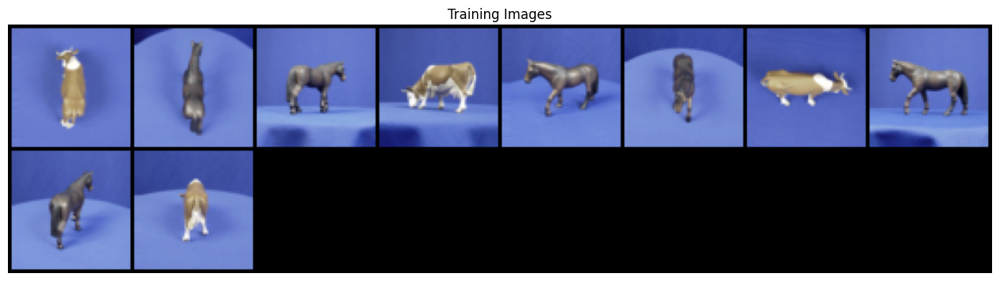

In [ ]:
# Plot some training images
real_batch = next(iter(trainloader))
plt.figure(figsize=(16,16))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

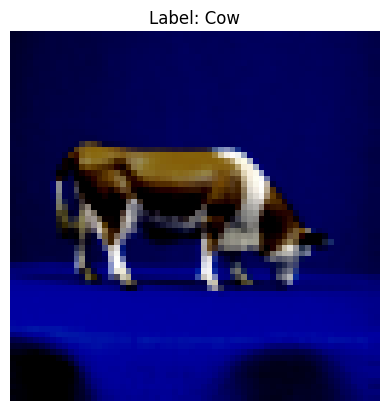

In [ ]:
# Define a function to display an image and its label
def show_image(img, label):
    plt.imshow(img.permute(1, 2, 0)) #rearranges the dimensions of the tensor
    plt.title("Label: {}".format("Cow" if label == 1 else "Horse"))
    plt.axis('off')
    plt.show()

# Display the first 10 images in the dataset
for i in range(1):
    img, label = trainset[i]
    show_image(img, label)


We can confirm that our data set is well labled and now we can go to the next step 



# Building the CNN classifier

In [ ]:
class MyNeuralNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        #Convolution Neural Network
        self.conv1 = nn.Conv2d(3,16,(3,3)) #the input is an RGB image of dim=3  ,the output will be : 62x62x16
        self.pool = nn.MaxPool2d(2) #we do a max pooling of 2x2 ,the output will be : 31x31x16
        self.conv2= nn.Conv2d(16,32,(2,2)) #the output will be : 30x30x64
        self.dropout = nn.Dropout(0.5)
        self.pool2 = nn.MaxPool2d(2)  #we do a max pooling of 2x2 ,the output will be : 15x15x64
        self.conv3= nn.Conv2d(32,8,(2,2))#the output will be : 14x14x32
        self.Relu = nn.ReLU() #an activation function
        self.FC1 = nn.Linear(1352,800 )#Artificial Neural Network of 1352 neurons conected to 800 neurons
        self.FC2 = nn.Linear(800,200 )#ANN of 800 neurons conected to 200 neurons
        self.dropout2 = nn.Dropout(0.15) # (0.15) is the probability of setting a unit to 0. During training 
        self.FC3 = nn.Linear(526,126 )
        self.FC4 = nn.Linear(200,2)#the last flatten layer with output of 2 (Cow or Horse)

   #defining the forward pass of the network 
    def forward(self, x):
        x = self.Relu(self.conv1(x))
        x = self.pool(x)
        x = self.Relu(self.conv2(x))
        x = self.dropout(x)
        x = self.pool2(x)
        x = self.Relu(self.conv3(x))
        x = self.FC1(x.view(-1,1352)) #Reshape 
        x = self.dropout2(x)
        x = self.Relu(self.FC2(x))
        x = self.dropout(x)
       # x= self.Relu(self.FC3(x))
        x = nn.functional.softmax(self.FC4(x), dim=1)#softmax is an activation function ,usually is used at the output layer 
        return x
class MyNeuralNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3,32,(4,4))
        self.pool = nn.MaxPool2d(4)
        self.dropout = nn.Dropout(0.2)
        self.conv2= nn.Conv2d(32,8,(2,2))
        self.pool2 = nn.MaxPool2d(2)
        self.Relu = nn.ReLU()
        self.flatten = nn.Flatten()
        self.FC1 = nn.Linear(392,176)
        self.FC2 = nn.Linear(176,2)


    def forward(self, x):
        x = self.Relu(self.conv1(x))
        x = self.dropout(x)
        x = self.pool(x)
        x = self.Relu(self.conv2(x))
        x = self.dropout(x)
        x = self.pool2(x)
        x = self.FC1(x.view(-1,392)) #Reshape 
        x = nn.functional.softmax(self.FC2(x), dim=1)
        return x


In [ ]:
#we instantiate the class "MyNeuralNetwork"
Mymodel = MyNeuralNetwork()
#send it to the GPU  
Mymodel.to(device)
#Print the architecture of the model 
print(Mymodel)

MyNeuralNetwork(
  (conv1): Conv2d(3, 100, kernel_size=(4, 4), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.2, inplace=False)
  (conv2): Conv2d(100, 8, kernel_size=(2, 2), stride=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Relu): ReLU()
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (FC1): Linear(in_features=392, out_features=176, bias=True)
  (FC2): Linear(in_features=176, out_features=2, bias=True)
)


# Trainig and Testing the CNN classifier:


```
# Ce texte est au format code
```

 

In [ ]:
n_epochs = 20 #Define the number of epoch
optimizer = optim.SGD(Mymodel.parameters(), lr=0.01 )  #stochastic gradient descent (SGD) optimizer
criterion = nn.CrossEntropyLoss() # Creates an instance of the cross-entropy loss function

for epoch in range(n_epochs):  # loop over the dataset multiple times
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        # zero the parameter gradients
        optimizer.zero_grad()  # The gradient usually is set to zero at every sample iteration
        # forward + backward + optimize
        outputs = Mymodel(inputs.to(device))
        loss = criterion(outputs, labels.to(device).long()) 
        loss.backward() # Computes the gradient for every parameter
        optimizer.step() # Update the weights      
        # print statistics
        running_loss += loss.item() 
        if i % 2000 == 1999:     # print every 2000 mini-batches
          print(f'[{epoch + 1}, {i + 1:5d}] loss: {running_loss / 2000:.3f}')
          running_loss = 0.0

print('Finished Training')



#Testing Part
from prompt_toolkit import output
correct = 0
total = 0
# since we testing, we don't need to calculate the gradients for our outputs
with torch.no_grad():
    for data in trainloader:
        images, labels = data
        # calculate outputs by running images through the network
        outputs = Mymodel(images.type(torch.float).to(device)) 
        # the class with the highest energy is what we choose as prediction
        _, predicted = torch.max(outputs.data, 1) # Ask Tabia
        total += 10 # Calculating the total number of images
        correct += (predicted.to(device) == labels.to(device)).sum().item() # Calculating the number of correctl
#Printing the accuracy of the model 
print(f'The Accuracy of the network on the test images: {100 * correct // total} %')

MyNeuralNetwork(
  (conv1): Conv2d(3, 100, kernel_size=(4, 4), stride=(1, 1))
  (pool): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout(p=0.2, inplace=False)
  (conv2): Conv2d(100, 8, kernel_size=(2, 2), stride=(1, 1))
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Relu): ReLU()
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (FC1): Linear(in_features=392, out_features=176, bias=True)
  (FC2): Linear(in_features=176, out_features=2, bias=True)
)
Finished Training
The Accuracy of the network on the test images: 45 %


# **Generative Adversarial Networks**

Generative Adversarial Networks (GANs) are a class of deep learning models that are used for generating new data samples that are similar to a training dataset. They consist of two main components: a generator and a discriminator

In [ ]:
batch_size = 4 #we set the batch size to be 4 
image_size = 64 #we define the size of the generated images 
nc = 3 #number of color channels in the input images.
nz = 10 #length of latent vector.
ngf = 64 #relates to the depth of feature maps carried through the generator.
ndf = 64 #sets the depth of feature maps propagated through the discriminator.
num_epochs = 100 
beta1 = 0.5 #Hyperparameter for Adam optimizers.
lr = 0.002 #Learning rate for training.

**Architecture of the Generator**

In [ ]:
class Generator(nn.Module):
    def __init__(self) : 
      super().__init__() 
      self.gen=Sequential(       # Define the layers of the generator as a sequential module    
          #output size: (batch_size, 1024, 4, 4)
          ConvTranspose2d(10, 1024, 4,1,0,bias= False),
          BatchNorm2d(1024),
          ReLU(inplace= True), #output size: (batch_size, 1024, 4, 4)
          ConvTranspose2d(1024, 512,4,2,1, bias= False),
          BatchNorm2d(512),
          ReLU(inplace= True),#output size: (batch_size, 512, 8, 8)
          ConvTranspose2d(512,256,4,2,1,bias= False),
          BatchNorm2d(256),
          ReLU(inplace= True),#output size: (batch_size, 256, 16, 16)
          ConvTranspose2d(256,128,4,2,1, bias= False),
          BatchNorm2d(128),
          ReLU(inplace= True),#output size: (batch_size, 128, 32, 32)
          ConvTranspose2d(128,3,4,2,1, bias= False), #output size: (batch_size, 3, 64, 64)
          Tanh())
    def forward(self,input): # fit the input through the network
        return self.gen(input)

**Architecture of the Discriminator**

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input): #fit the input through the network
        return self.main(input)


Define new class to import Cows images then Horses : 

In [ ]:
class CustomImageDataset2(Dataset):
    def __init__(self, transform=None, target_transform=None, mode='Train'):
        #self.path_to_cow = os.path.join('/content','drive', 'MyDrive','Newdata', mode,'Cow')
        self.path_to_horse = os.path.join('/content','drive', 'MyDrive','Newdata',mode,'Horse')
        #self.img_dir= [os.path.join(self.path_to_cow, i) for i in os.listdir(self.path_to_cow)]
        self.img_dir = [os.path.join(self.path_to_horse, i) for i in os.listdir(self.path_to_horse)]
        #self.img_dir = self.img_dir_cow 
        #+ self.img_dir_horse
        self.nbre_images = len(self.img_dir)
        self.labels = np.zeros(self.nbre_images)
        self.transform = transform
    def __len__(self):
        return self.nbre_images

    def __getitem__(self, idx):
        image = read_image(self.img_dir[idx])
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        return image, label


Define our transformer to convert images into 64 by 64 pixels

In [ ]:
transform = transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((64,64)),#convert images into 64 by 64 pixels
            transforms.ToTensor()
            ])   

Load the train set to train the discriminator to distinguish between the fake and the original images .

In [ ]:
trainset = CustomImageDataset2(transform=transform)  #instantiate the CustomImageDataset 2 class
trainloader = torch.utils.data.DataLoader(trainset, batch_size,shuffle=True, num_workers=2) #load the data using DataLoader module

## Traing GAN

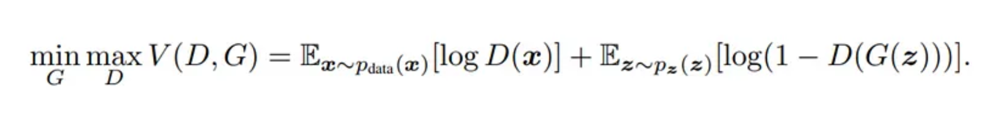

In [ ]:
myDis = Discriminator().to(device)#we instantiate the class Discriminator 
myGen=Generator().to(device) #we instantiate the class Discriminator 

n_epochs = 100 #define the number of epochs 
optimizerG = optim.Adam(myGen.parameters(), lr = 0.0002 ,betas=(0.5,0.999)) #we set Adam as an optimizer to our Generator
optimizerD = optim.Adam(myDis.parameters(), lr = 0.0002 ,betas=(0.5,0.999)) #we set Adam as an optimizer to our Discriminator
loss = nn.BCELoss() #we will use binary Cross Entropy as our Loss Function 
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

errG=[] #define a list in order to save the values of the generator loss
errD=[] ##define a list in order to save the values of the discriminator loss
img_list=[]
iters = 0

for epoch in range(n_epochs):
  for i,input in enumerate (trainloader):
     #loss on real images  
    optimizerD.zero_grad() #set the gradient to zero after each iteration 
    image = input[0].to(device) #import the image into the device
    b_size = image.size(0) 
    y_out = myDis(image.to(device)).view(-1)  #fit the image trought D
    target=torch.ones(b_size,dtype=torch.float ,device=device) #defining a target output of 1 for the real images 
    loss_real=loss(y_out,target) #calculate the loss of the real images
    loss_real.backward() #backpropagating the loss through the discriminator model 

    #loss on fake images 
    noise = torch.randn(b_size,nz,1,1) #Generate a batch of random noise vectors
    fake_img=myGen(noise.to(device)) #Generating a 64x64 images from the generator
    y_out=myDis(fake_img.detach()).view(-1) # Passing the generated images through the Discriminator 
    target=torch.zeros(b_size,dtype=torch.float ,device=device)  #defining a target output of 0 for the fake images 
    loss_fake=loss(y_out,target) #calculating the loss 
    loss_fake.backward() ##backpropagating the loss through the discriminator model 
    loss_D=loss_real+loss_fake #calculating the loss of the Discriminator
    optimizerD.step() #update the discriminator's parameters


    #GENERATOR
    optimizerG.zero_grad()  #set the gradient to zero after each iteration 
    yhat =myDis(fake_img).view(-1)  #compute the discriminator's output for the fake images
    target = torch.ones(b_size, dtype=torch.float, device=device) #define a target output of 1 for the discriminator "goal is to fool discriminator"
    gen_loss = loss(yhat, target) #calculating the loss of the Generator
    gen_loss.backward() #backpropagate the loss through the generator model
    optimizerG.step()   #update the generator's parameters
    # Save Losses for plotting later
    errG.append(gen_loss.item())
    errD.append(loss_D.item())
    if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(trainloader)-1)):
          with torch.no_grad():
              fake = myGen(fixed_noise).detach().cpu()
          img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

print ('finish training')

finish training


# Results

**Generator and Discriminator Loss During Training**

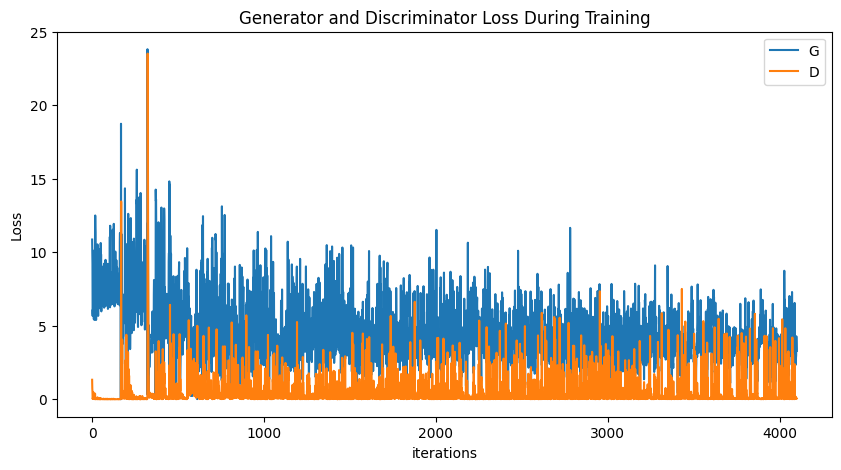

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(errG,label="G")
plt.plot(errD,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

Visualization of G’s progression

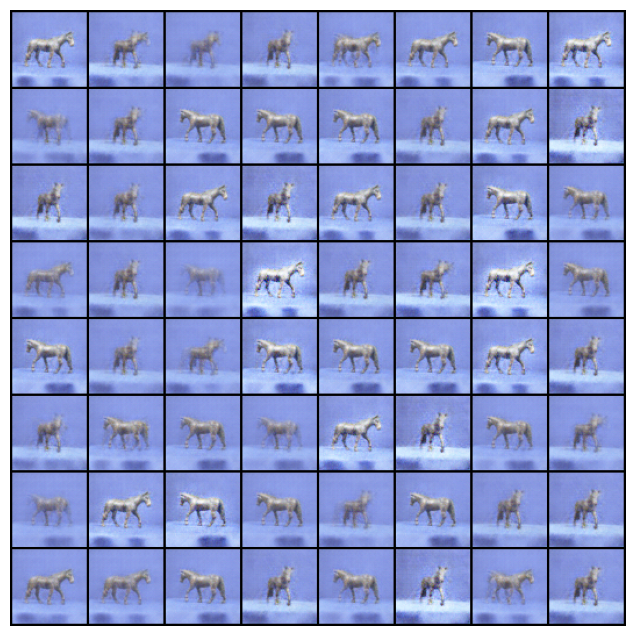

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)
HTML(ani.to_jshtml())

## Real Images vs. Fake Images

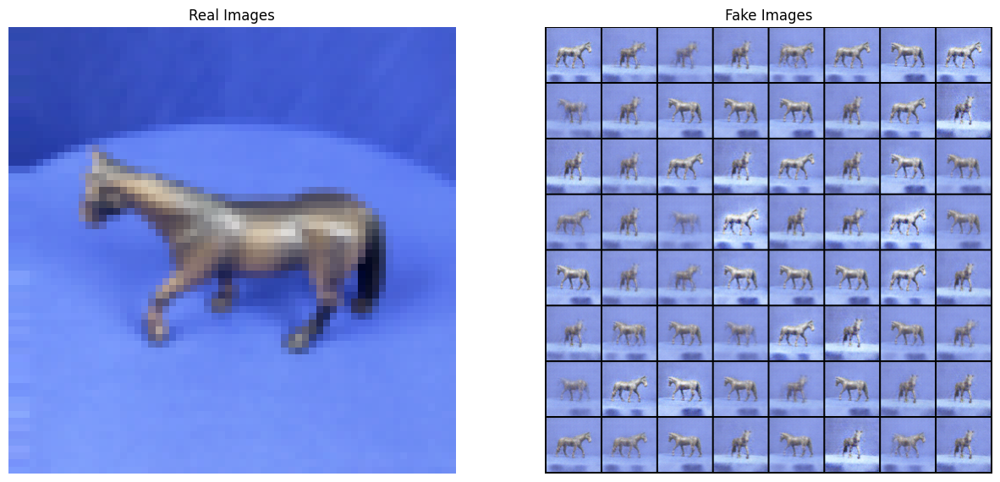

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(trainloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

# Saving The Images:

In order to save the images , we will use a sipmle loop 


In [ ]:
from torchvision.utils import save_image #import the package from trochvision
for i in range (500): #Generate 500 Images 
  %matplotlib inline 
  noise = torch.randn(1,nz,1,1 , device=device) #create some random noise of size nz=10 
  fake_img=myGen(noise.to(device)) #fit the noise trought our Generator  
  save_image(fake_img,f'/content/drive/MyDrive/Newdata/Train/Horse/{i}.png') #Save the Generated image in google drive file 
  fake_img=fake_img.cpu().detach().squeeze().permute(1,2,0).numpy() #reshape our image to be able to display it 
  plt.imshow(fake_img) #
  plt.show()


After saving all the images , we can rerun our model again with the augmented data and notice the improvement of the accuracy 